## Installing the libraries

In [1]:
!pip install torch==2.3.0+cu118 torchvision torchaudio torchtext torchdata xformers --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 839.6/839.6 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 69.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 59.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 59.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 728.5/728.5 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12

In [2]:
!pip install diffusers
!pip install -q accelerate transformers xformers

In [3]:
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.4/282.4 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.0/510.0 kB 25.6 MB/s eta 0:00:00


In [4]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch
import cv2 #OpenCV
from PIL import Image
import numpy as np

In [5]:
def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)

  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
      img = img.resize((w,h))
      grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

## Generating images using edges



### ControlNet model + Canny Edge



In [6]:
controlnet_canny_model = 'lllyasviel/sd-controlnet-canny'
control_net_canny = ControlNetModel.from_pretrained(controlnet_canny_model, torch_dtype=torch.float16)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

In [7]:
pipe = StableDiffusionControlNetPipeline.from_pretrained('stable-diffusion-v1-5/stable-diffusion-v1-5',
                                                         controlnet=control_net_canny,
                                                         torch_dtype=torch.float16)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [8]:
from diffusers import UniPCMultistepScheduler
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

In [9]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_model_cpu_offload()

### Loading the image



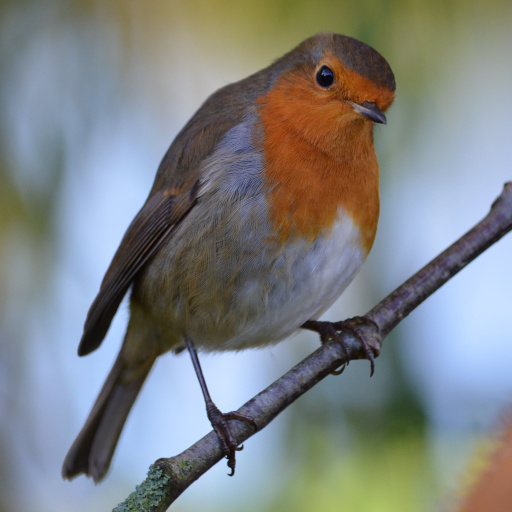

In [10]:
img = Image.open('/content/bird.jpg')
img

In [11]:
type(img)

PIL.JpegImagePlugin.JpegImageFile

### Detecting edges using Canny Edge  


In [20]:
def canny_edge(img, low_threshold = 100, high_threshold = 200):
  img = np.array(img)
  img = cv2.Canny(img, low_threshold, high_threshold)
  img = img[:, :, None]
  img = np.concatenate([img, img, img], axis = 2)
  canny_img = Image.fromarray(img)
  return canny_img

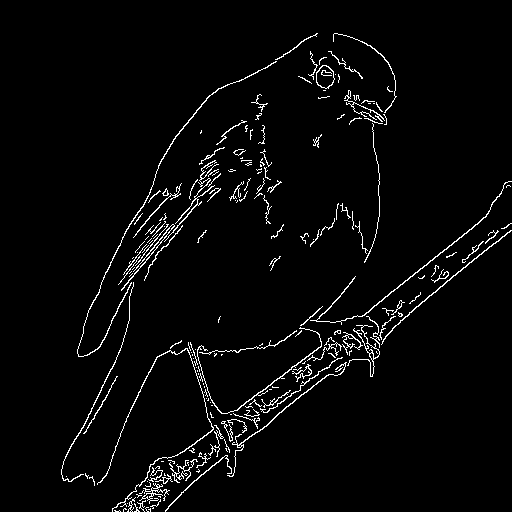

In [21]:
canny_img = canny_edge(img)
canny_img

  0%|          | 0/20 [00:00<?, ?it/s]

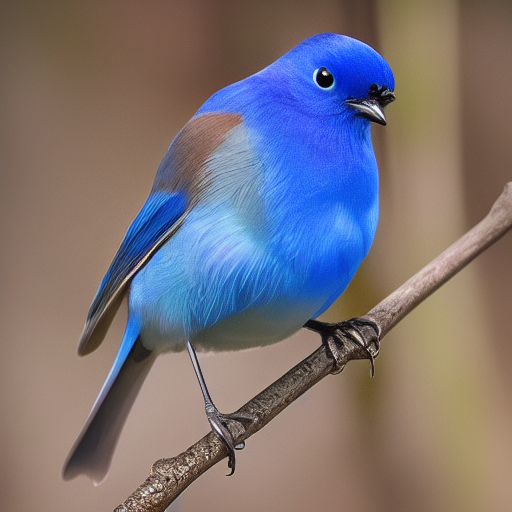

In [22]:
prompt = "realistic photo of a blue bird with purple details, high quality, natural light"
neg_prompt = ""

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

imgs.images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

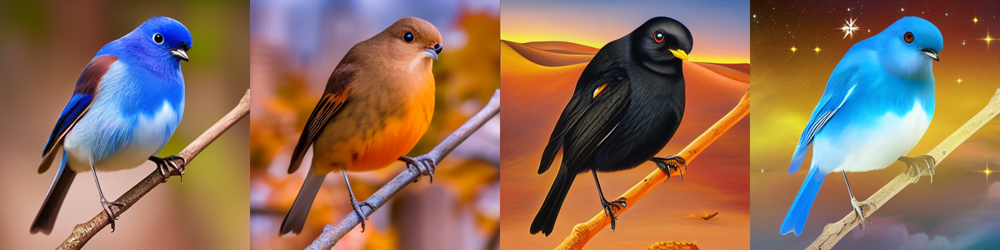

In [23]:
prompt = ["realistic photo of a blue bird with purple details, high quality, natural light",
          "realistic photo of a bird in new york during autumn, city in the background",
          "oil painting of a black bird in the desert, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "digital painting of a blue bird in space, stars and galaxy in the background, trending on artstation"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, len(prompt), scale=0.75)

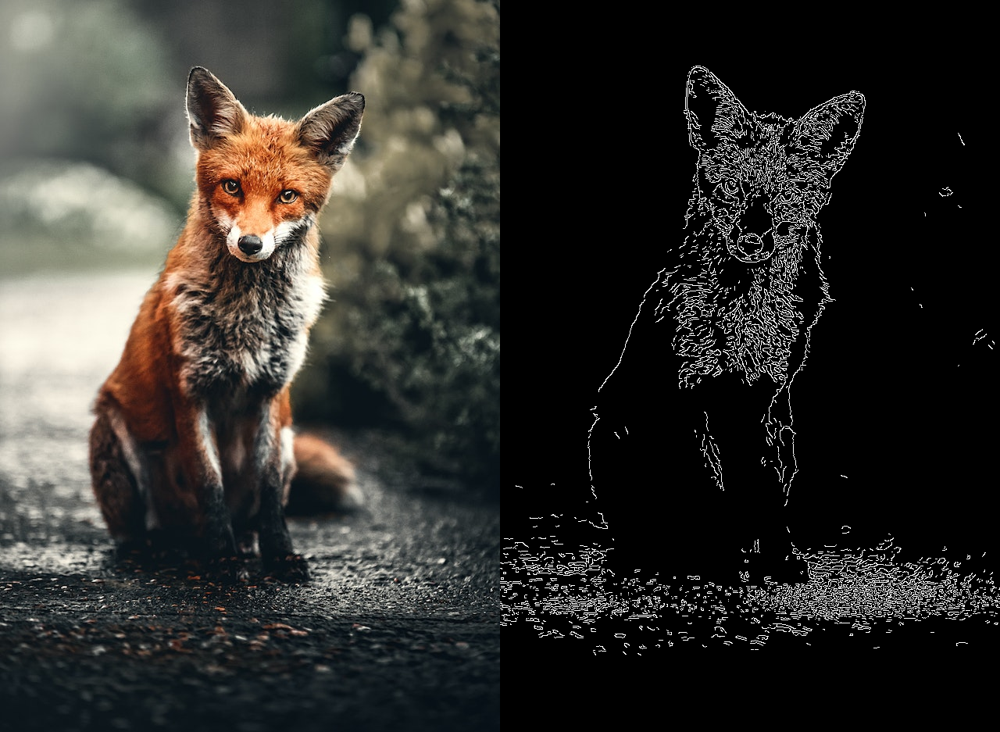

In [24]:
img = Image.open("fox.jpg")

canny_img = canny_edge(img, 200, 255)

grid_img([img, canny_img], 1, 2)

In [25]:
prompt = ["realistic photo of a fox, high quality, natural light, sunset",
          "realistic photo of a fox in the snow, best quality, extremely detailed",
          "oil painting of fox the desert, canyons in the background, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "watercolor painting of a fox in space, blue and purple tones, stars and earth in the background"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, len(prompt), scale=0.75)

Output hidden; open in https://colab.research.google.com to view.

## Generating images using poses




### Loading the model to extract poses

In [1]:
from controlnet_aux import OpenposeDetector
pose_model = OpenposeDetector.from_pretrained('lllyasviel/ControlNet')

/usr/local/lib/python3.10/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


### Loading the image

In [6]:
img_pose = Image.open('/content/pose01.jpg')

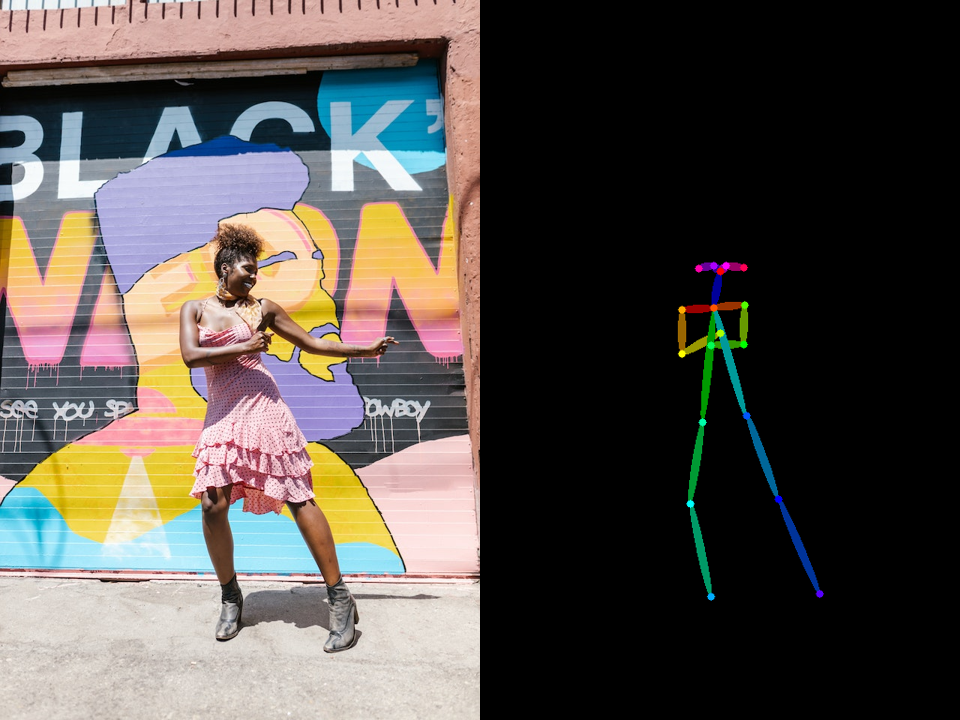

In [7]:
pose = pose_model(img_pose)
grid_img([img_pose, pose], rows=1, cols=2, scale=0.75)

### Loading the ControlNet model


In [8]:
controlnet_pose_model = ControlNetModel.from_pretrained('thibaud/controlnet-sd21-openpose-diffusers', torch_dtype=torch.float16)
sd_controlpose = StableDiffusionControlNetPipeline.from_pretrained('stabilityai/stable-diffusion-2-1-base',
                                                                   controlnet=controlnet_pose_model,
                                                                   torch_dtype=torch.float16)

An error occurred while trying to fetch thibaud/controlnet-sd21-openpose-diffusers: thibaud/controlnet-sd21-openpose-diffusers does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [9]:
sd_controlpose.enable_model_cpu_offload()
sd_controlpose.enable_attention_slicing()
sd_controlpose.enable_xformers_memory_efficient_attention()

In [10]:
from diffusers import DEISMultistepScheduler

sd_controlpose.scheduler = DEISMultistepScheduler.from_config(sd_controlpose.scheduler.config)

In [11]:
seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)
prompt = "professional photo of a young woman in the park, wearing a coat, sharp focus, insanely detailed, photorealistic, sunset, side light"
neg_prompt = "ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)

Output hidden; open in https://colab.research.google.com to view.

> Other tests

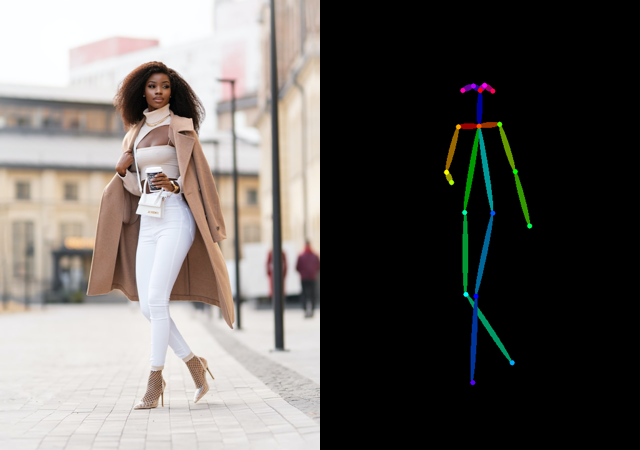

In [12]:
img_pose = Image.open("pose02.jpg")

pose = pose_model(img_pose)

grid_img([img_pose, pose], 1, 2, scale=0.5)

In [13]:
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)

Output hidden; open in https://colab.research.google.com to view.

  0%|          | 0/20 [00:00<?, ?it/s]

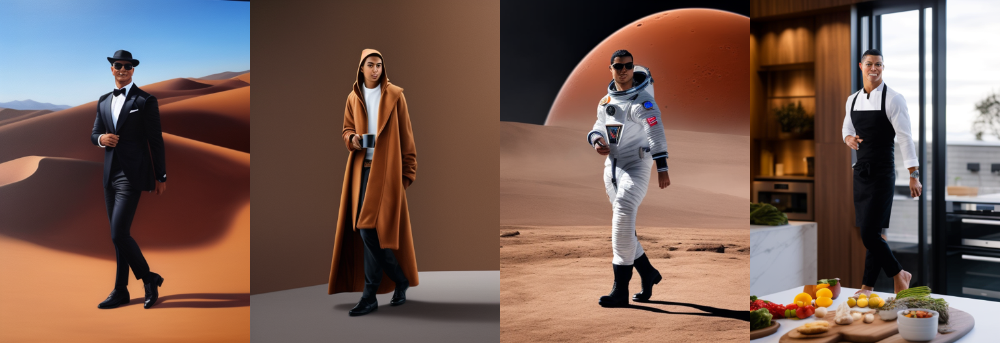

In [23]:
prompt = ["oil painting Ronaldo wearing a suit and black hat and sunglasses, face portrait, in the desert, realistic, vivid",
          "oil painting Ronaldo wearing a jedi brown coat, face portrait, wearing a hood, holding a cup of coffee, in another planet, realistic, vivid",
          "professional photo of Ronaldo wearing a space suit, face portrait, in mars, realistic, vivid",
          "professional photo of Ronaldo in the kitchen, face portrait, realistic, vivid"]

neg_prompt = ["helmet, ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"] * len(prompt)
num_imgs = 1

generator = torch.Generator(device="cuda").manual_seed(seed)
imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, len(prompt), 0.75)

In [24]:
from diffusers import EulerAncestralDiscreteScheduler

sd_controlpose.scheduler = EulerAncestralDiscreteScheduler.from_config(sd_controlpose.scheduler.config)

  0%|          | 0/20 [00:00<?, ?it/s]

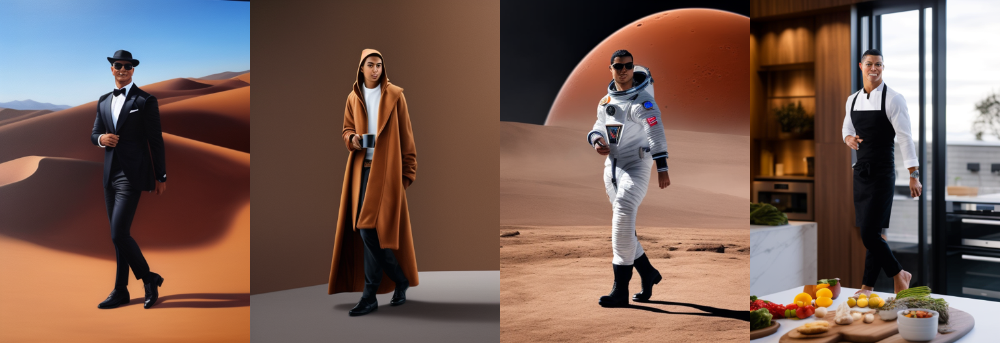

In [25]:
generator = torch.Generator(device="cuda").manual_seed(seed)
imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, len(prompt), 0.75)

In [26]:
from diffusers.utils import load_image

In [27]:
urls = "yoga1.jpeg", "yoga2.jpeg", "yoga3.jpeg", "yoga4.jpeg"
imgs = [load_image("https://hf.co/datasets/YiYiXu/controlnet-testing/resolve/main/" + url) for url in urls]

In [28]:
imgs

[<PIL.Image.Image image mode=RGB size=194x259>,
 <PIL.Image.Image image mode=RGB size=194x259>,
 <PIL.Image.Image image mode=RGB size=251x201>,
 <PIL.Image.Image image mode=RGB size=251x201>]

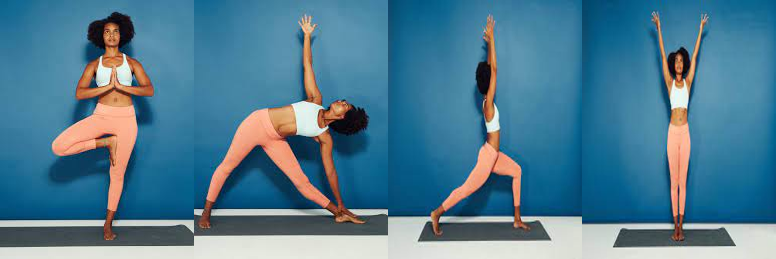

In [20]:
grid_img(imgs, rows=1, cols=4)

In [21]:
poses = [pose_model(img) for img in imgs]

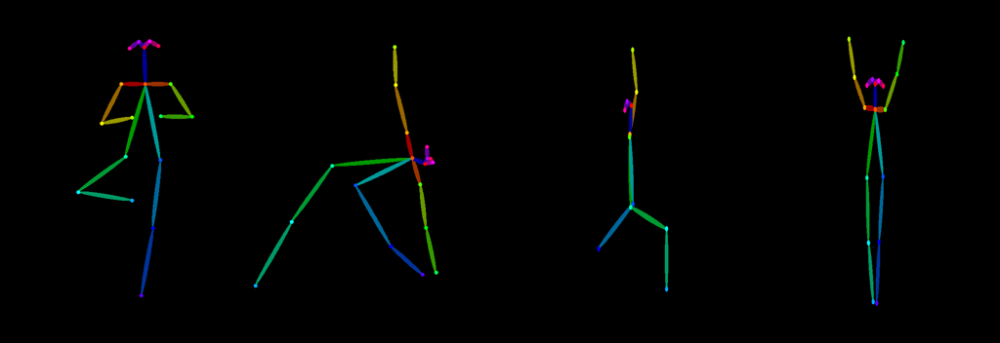

In [22]:
grid_img(poses, 1, 4, scale = 0.5)

  0%|          | 0/30 [00:00<?, ?it/s]

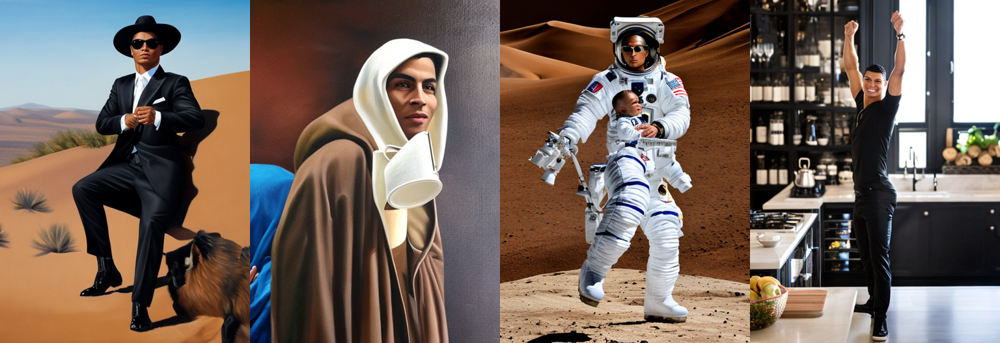

In [29]:
from diffusers import DEISMultistepScheduler

sd_controlpose.scheduler = DEISMultistepScheduler.from_config(sd_controlpose.scheduler.config)

prompt = ["oil painting Ronaldo wearing a suit and black hat and sunglasses, face portrait, in the desert, realistic, vivid",
          "oil painting Ronaldo wearing a jedi brown coat, face portrait, wearing a hood, holding a cup of coffee, in another planet, realistic, vivid",
          "professional photo of Ronaldo wearing a space suit, face portrait, in mars, realistic, vivid",
          "professional photo of Ronaldo in the kitchen, face portrait, realistic, vivid"]

neg_prompt = ["helmet, ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"] * len(prompt)


generator = torch.Generator(device="cuda").manual_seed(seed)
output = sd_controlpose(
    prompt,
    poses,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=30,
)
grid_img(output.images, 1, len(prompt), 0.75)

> Sitting pose

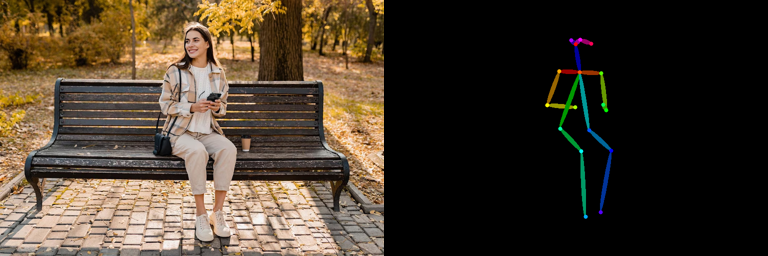

In [30]:
img_pose = Image.open("bench02_img.jpg")

pose = pose_model(img_pose)

grid_img([img_pose, pose], 1, 2, scale=0.5)

  0%|          | 0/20 [00:00<?, ?it/s]

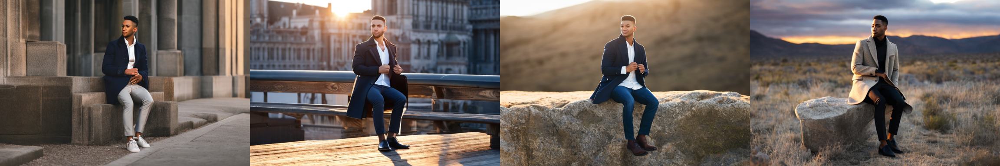

In [32]:
prompt = "professional photo of a young man sitting in a , wearing a coat, sharp focus, insanely detailed, photorealistic, sunset, side light"
neg_prompt = "ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)